<a href="https://colab.research.google.com/github/Robsrepo42/AudioAdScanner/blob/main/AdScanner_Project_Presentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Prerequisites

In [ ]:
!pip install librosa==0.8.0

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.mlab import specgram
import librosa 
import librosa.display
from IPython.display import Audio
from scipy.io import wavfile
from scipy import stats
from skimage.feature import peak_local_max

In [4]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})

In [ ]:
# import numpy as np # for handling vectors, matrizes and n-dim arrays
# import pandas as pd # handling and analysing data (library)
# import matplotlib.pyplot as plt # mathematical plotting (graphing) engine
# import seaborn # makes your plots prettier
# seaborn.set(style='ticks')
# from glob import glob # UNIX Style pathname pattern extension
# from IPython.display import Audio # importing Audio Playback Widget
# import os # interaction with Operating system
# import sys # module provides info re constants, functions and methods
# import librosa # library to read and manipulate audio data (librosa.org)
# import librosa.display # display module needs to be imported separately
# from matplotlib.mlab import specgram # for Spectrograms
# from matplotlib.pyplot import specgram # for Spectrograms in librosa 0.6.0
# import pydub # convert .mp3 to .wav Files
# from pydub import AudioSegment
# import simpleaudio as sa # a well documented simple audio package
# import scipy # software ecosystem for mathematics, science, and engineering
# from scipy.io import wavfile
# from scipy import stats
# from skimage.feature import peak_local_max

# Data Load Reduction Routine

## REGION NORD

In [ ]:
# Creating list of Foldernames in "nord"
%cd /content/drive/MyDrive/Notebooks/AdScanner/RAW/nord/
for root, ndirnames, filenames in os.walk('.'):
  print (ndirnames)
  break

/content/drive/MyDrive/Notebooks/AdScanner/RAW/nord
['2020-12-07', '2020-12-04', '2020-12-05', '2020-12-08', '2020-12-03', '2020-12-09', '2020-12-06', '2020-12-10', '2020-12-12', '2020-12-11', '2020-12-13', '2020-12-15', '2020-12-14', '2020-12-16', '2020-12-17', '2020-12-18', '2020-12-20', '2020-12-19', '2020-12-21', '2020-12-22', '2020-12-23', '2020-12-24', '.ipynb_checkpoints', 'ncombrx', '2020-12-26', '2020-12-25', '2020-12-27', '2020-12-28', '2020-12-29', '2020-12-30', '2021-01-01', '2020-12-31', '2021-01-02', '2021-01-03', '2021-01-04', '2020-11-30', '2020-12-02', '2020-12-01', '2020-11-27', '2020-11-28', '2020-11-29', '2020-11-24', '2020-11-25', '2020-11-26', '2020-11-21', '2020-11-23', '2020-11-22', '2020-11-18', '2020-11-20', '2020-11-19', '2020-11-15', '2020-11-16', '2020-11-17', '2020-11-12', '2020-11-14', '2020-11-13', '2020-11-09', '2020-11-11', '2020-11-10', '2020-11-07', '2020-11-06', '2020-11-08', '2020-11-05', '2020-11-03', '2020-11-04', '2020-10-30', '2020-11-02', '202

In [ ]:
# For-Loop that copies files to subdirectory if they don't exist, yet
scr = '/content/drive/MyDrive/Notebooks/AdScanner/RAW/nord/'
for x in ndirnames:
  if x == ".ipynb_checkpoints":
    continue
  if x == "ncombrx":
    continue
  path = (scr + x)
  %cd {path}
  %cp -uv *5500.mp3 /content/drive/MyDrive/Notebooks/AdScanner/RAW/nord/ncombrx
  %cp -uv *0000.mp3 /content/drive/MyDrive/Notebooks/AdScanner/RAW/nord/ncombrx
  %cp -uv *2500.mp3 /content/drive/MyDrive/Notebooks/AdScanner/RAW/nord/ncombrx
  %cp -uv *3000.mp3 /content/drive/MyDrive/Notebooks/AdScanner/RAW/nord/ncombrx
  print(path)

In [ ]:
# Counting the files in the target directory
source = '/content/drive/MyDrive/Notebooks/AdScanner/RAW/nord/ncombrx'
audio_files = glob(source + '/*.mp3') # defines Audio Files as the MP3s in the source directory
len(audio_files) # how many MP3s are in the source Dir?

7892

## REGION OST

In [ ]:
# Creating a list of the Foldernames in "ost"
%cd /content/drive/MyDrive/Notebooks/AdScanner/RAW/ost/
for root, odirnames, filenames in os.walk('.'):
  print (odirnames)
  break

/content/drive/MyDrive/Notebooks/AdScanner/RAW/ost
['2020-12-06', '2020-12-07', '2020-12-04', '2020-12-09', '2020-12-05', '2020-12-08', '2020-12-03', '2020-12-10', '2020-12-13', '2020-12-14', '2020-12-11', '2020-12-12', '2020-12-02', '2020-12-01', '2020-11-30', '2020-11-27', '2020-11-28', '2020-11-29', '2020-11-25', '2020-11-24', '2020-11-26', '2020-11-21', '2020-11-22', '2020-11-23', '2020-12-15', '2020-12-16', '2020-12-17', '2020-11-18', '2020-11-20', '2020-11-19', '2020-11-17', '2020-11-16', '2020-11-15', '2020-11-14', '2020-11-12', '2020-11-13', '2020-12-18', '2020-12-19', '2020-12-20', '2020-12-21', '2020-11-09', '2020-11-10', '2020-11-11', '2020-11-06', '2020-11-07', '2020-11-08', '2020-12-23', '2020-12-22', '2020-12-25', '2020-12-26', '2020-12-27', '2020-12-28', '2020-12-29', '2020-12-30', '2020-12-24', '2021-01-01', '2020-12-31', '2021-01-02', '2021-01-03', 'ocombrx', '2021-01-04', '2020-10-29', '2020-10-30', '2020-11-01', '2020-10-31', '2020-11-02', '2021-01-05', '2021-01-06',

In [ ]:
# For-Loop that copies files to subdirectory if they don't exist, yet
scr = '/content/drive/MyDrive/Notebooks/AdScanner/RAW/ost/'
for x in odirnames:
  if x == ".ipynb_checkpoints":
    continue
  if x == "ocombrx":
    continue
  path = (scr + x)
  %cd {path}
  %cp -uv *5500.mp3 /content/drive/MyDrive/Notebooks/AdScanner/RAW/ost/ocombrx
  %cp -uv *0000.mp3 /content/drive/MyDrive/Notebooks/AdScanner/RAW/ost/ocombrx
  %cp -uv *2500.mp3 /content/drive/MyDrive/Notebooks/AdScanner/RAW/ost/ocombrx
  %cp -uv *3000.mp3 /content/drive/MyDrive/Notebooks/AdScanner/RAW/ost/ocombrx
  print(path)

In [ ]:
# Counting the files in the target directory
osource = '/content/drive/MyDrive/Notebooks/AdScanner/RAW/ost/ocombrx'
audio_ofiles = glob(osource + '/*.mp3') # defines Audio Files as the MP3s in the source directory
len(audio_ofiles) # how many MP3s are in the source Dir?

7642

## REGION WEST

In [ ]:
# Creating a list of the Foldernames in "west"
%cd /content/drive/MyDrive/Notebooks/AdScanner/RAW/west/
for root, wdirnames, filenames in os.walk('.'):
  print (wdirnames)
  break

/content/drive/MyDrive/Notebooks/AdScanner/RAW/west
['2020-12-05', '2020-12-07', '2020-12-08', '2020-12-09', '2020-12-04', '2020-12-06', '2020-12-03', '2020-12-10', '2020-12-02', '2020-11-24', '2020-11-23', '2020-11-25', '2020-11-26', '2020-11-22', '2020-11-20', '2020-11-21', '2020-11-17', '2020-11-15', '2020-11-16', '2020-11-18', '2020-11-19', '2020-11-10', '2020-11-11', '2020-11-27--2020-12-01 - Lücke wg. Linkwechsel', '2020-12-11', '2020-11-13', '2020-11-12', '2020-11-14', '2020-11-08', '2020-11-09', '2020-11-07', '2020-11-05', '2020-11-06', '2020-11-04(_nur 168 von 288)', '2020-11-01', '2020-11-03', '2020-11-02', '2020-10-29', '2020-10-30', '2020-10-31', '2020-12-14', '2020-12-13', '2020-12-12', '2020-12-15', '2020-12-16', '2020-12-17', '2020-12-19', '2020-12-18', '2020-12-20', '2020-12-21', '2020-12-22', '2020-12-25', '2020-12-23', '2020-12-24', '2020-12-26', '2020-12-27', '2020-12-28', '2020-12-30', '2020-12-29', '2020-12-31', '2021-01-01', '2021-01-02', '2021-01-03', 'wcombrx',

In [ ]:
# For-Loop that copies files to subdirectory if they don't exist, yet
scr = '/content/drive/MyDrive/Notebooks/AdScanner/RAW/west/'
for x in wdirnames:
  if x == ".ipynb_checkpoints":
    continue
  if x == "wcombrx":
    continue
  path = (scr + x)
  %cd {path}
  %cp -uv *5500.mp3 /content/drive/MyDrive/Notebooks/AdScanner/RAW/west/wcombrx
  %cp -uv *0000.mp3 /content/drive/MyDrive/Notebooks/AdScanner/RAW/west/wcombrx
  %cp -uv *2500.mp3 /content/drive/MyDrive/Notebooks/AdScanner/RAW/west/wcombrx
  %cp -uv *3000.mp3 /content/drive/MyDrive/Notebooks/AdScanner/RAW/west/wcombrx
  print(path)

In [ ]:
# Counting the files in the target directory
wsource = '/content/drive/MyDrive/Notebooks/AdScanner/RAW/west/wcombrx'
audio_wfiles = glob(wsource + '/*.mp3') # defines Audio Files as the MP3s in the source directory
len(audio_wfiles) # how many MP3s are in the source Dir?

7429

# Loading Audio to create data arrays from MP3-Files

In [5]:
# Defining the audio sample rate for everything that follows
sr = 22050 # samples the audio 44100 times per second

In [6]:
# MP3 paths
werbe_sep = '/content/drive/MyDrive/Notebooks/AdScanner/Werbetrenner.mp3' # This short audio signals the beginning of the Adbreak
com_break_mp3 = '/content/drive/MyDrive/Notebooks/AdScanner/1_Break_Spots/20201030-075500.mp3' # 5 Minute Recording containing one whole Adbreak
ALDI_mp3 = '/content/drive/MyDrive/Notebooks/AdScanner/1_Break_Spots/ALDI_20s.mp3' # One Commercial contained in the Adbreak above
news_opn = '/content/drive/MyDrive/Notebooks/AdScanner/1_Break_Spots/Newsopener_2s.mp3' # The "News-Opener" signals the End of the Adbreak

In [ ]:
# Creating numpy arrays from all four MP3-Files with Librosa, Sample Rate: 44100 per Second in Mono (1 Channel)
ALDI_array, rate = librosa.load(ALDI_mp3, sr=sr, mono=True) # creates a numpy array
com_break_array, rate = librosa.load(com_break_mp3, sr=sr, mono=True)
werbe_sep_array, rate = librosa.load(werbe_sep, sr=sr, mono=True)
news_opn_array, rate = librosa.load(news_opn, sr=sr, mono=True)

# Selecting an Audio data array for further analysis

In [8]:
# Selecting an Audio from above and defining the sample rate (sr) as the one used in reading the audio
audio = com_break_array # Here you pick one from above
sr = rate

In [9]:
# Some Information about the selected Audio
print(audio.shape, sr) # number of observations and sample rate per sec
print(sr) # the sample rate
print('duration (Sec.): ', len(audio)/sr) # length of audio

(6616512,) 22050
22050
duration (Sec.):  300.06857142857143


# Checking Data Audiovisually

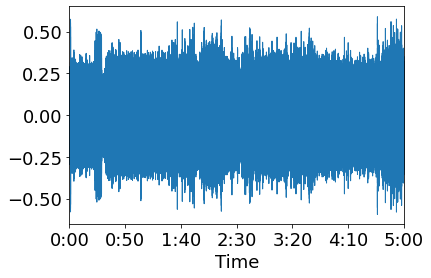

In [10]:
# Plotting the Audios Wave
librosa.display.waveplot(audio, sr);

In [11]:
# Play the Audio from Data (IPython Audio Widget):
Audio(data=audio, rate=sr)

In [12]:
print("Duration Audio in Seconds: ", len(audio)/rate)
print("Duration Audio in Minutes: ", len(audio)/rate/60)

Duration Audio in Seconds:  300.06857142857143
Duration Audio in Minutes:  5.001142857142857


# Creating Spectrograms from Audio (FFT - Fast Fourier Transform)
https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.specgram.html

In [13]:
# Relabeling the data to fit variables that work also for comparisons of multiple files
song_array1 = audio
rate1 = rate

In [14]:
# Using function :: matplotlib.pyplot.specgram to create a Spectrogramm 
spec1, freqs1, t1 = specgram(song_array1, NFFT=4096, Fs=rate1, noverlap=2048) # NFFT = Hop_length, the (n)Overlap is always half the Hop_lenght
spec1[spec1 == 0] = 1e-6 # this prevents that spec1 can ever be Zero, if it should be zero it is replaced by something very small

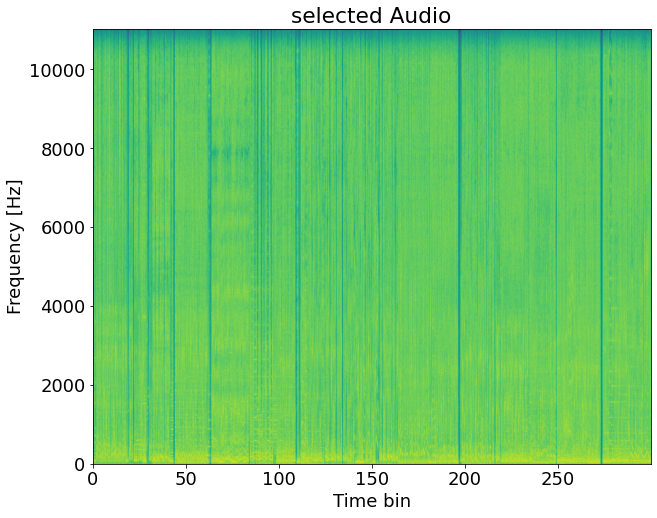

In [15]:
# Plotting the Spectrogram of the Audio
fig1 = plt.figure(figsize=(10, 8), facecolor='white')
extent = 0, np.amax(t1), freqs1[0], freqs1[-1]
Z1 = 10.0 * np.log10(spec1)
Z1 = np.flipud(Z1)
plt.imshow(Z1, cmap='viridis', extent=extent) # plots the image
plt.xlabel('Time bin')
plt.ylabel('Frequency [Hz]')
plt.title('selected Audio')
plt.axis('auto') # aspect ratio zwischen den Achsen (bewirkt Wertstauchung auf Y)
ax = plt.gca() # ermöglicht Zugriff auf Achsenelement aus dem Plot. Ermöglicht die nächsten beiden Zeilen
ax.set_xlim([0, extent[1]])
ax.set_ylim([freqs1[0], freqs1[-1]])
plt.show()

# Creating Constellation Maps - i.e. mapping Peak Points in selected Audio

In [60]:
# Defining a Function that Plots Peak-Frequencies Points => a "Constellation Map"
def show_peaks(Z, freqs, t, coord, title):
    fig = plt.figure(figsize=(10, 8), facecolor='white')
    im = plt.imshow(Z, cmap='viridis')
    plt.scatter(coord[:, 1], coord[:, 0], s=1, color='r')
    ax = plt.gca()
    plt.colorbar(im)
    plt.xlabel('Time bin')
    plt.ylabel('Frequency')
    plt.title(title, fontsize=18)
    plt.axis('auto')
    ax.set_xlim([0, len(t)])
    ax.set_ylim([len(freqs), 0])
    #ax.xaxis.set_ticklabels([])
    #ax.yaxis.set_ticklabels([])
    plt.show()

In [61]:
# A Scipy Function that identifies local maximums given minium distance (from next peak) and minimum "height"
coordinates1 = peak_local_max(Z1, min_distance=15, threshold_abs=-60)

In [52]:
print(len(coordinates1))

5309


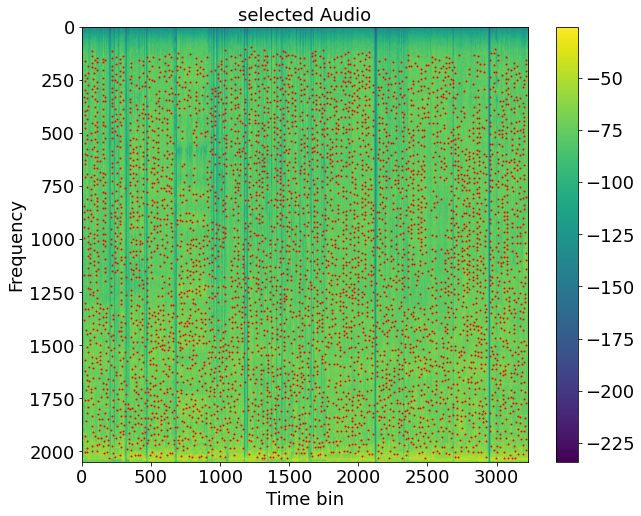

In [62]:
show_peaks(Z1, freqs1, t1, coordinates1, 'selected Audio')

# Defining Functions for finding Peak-Pairs in target zones

In [63]:
def identify_peaks(im, *args, **kwargs): 
    # Encapsulate this functionality for possible replacements of the function that generates `coordinates`.
    coordinates = peak_local_max(im, *args, **kwargs) # Scipy peak_local_max aus imagedata + Sternchenoperatoren
    
    time_coordinates = coordinates[:, 1]
    freq_coordinates = coordinates[:, 0]
    
    time_sort_ind = np.argsort(time_coordinates)
    
    return (freq_coordinates[time_sort_ind],
            time_coordinates[time_sort_ind])

In [97]:
# This function returns a booleans mask, which defines the target zone.
def define_target_zone(dt):
    tz_start = 0
    
    tz_end_type = 'count'
    tz_end = 300
    
    tz_upper = np.inf
    tz_lower = -np.inf
    
    max_tz_length = 10
    
    # 1. Define the starting point of the target zone (and also include all consecutive points).
    target_zone = (dt > tz_start)
    
    # 2. Define the ending point of the target zone.
    # If `tz_end_type` equals 'count', the number of points in the zone is considered rather than the time.
    if tz_end_type == 'count':
        # Sum per column and take only those points where the sum is within the limit of `tz_end`.
        target_zone = target_zone & (np.cumsum(target_zone, axis = 0) <= tz_end)
        
        # Nonetheless apply a upper contraint for the time to keep the target zone resonably sized.
        target_zone = target_zone & (dt <= tz_start + max_tz_length)
    else:
        target_zone = target_zone & (dt <= tz_end)
        
    # 3. Apply lower and upper bounds for the frequency range of the target zone.
    #TODO:
    
    return target_zone

In [65]:
def extract_pairs(im, freqs, t, *args, **kwargs):
    freq_coords, time_coords = identify_peaks(im, *args, **kwargs)
    
    # Explicitly reshape `freqs` and `t` to make them column vectors.
    freqs = np.reshape(freqs[freq_coords], (-1, 1))
    t = np.reshape(t[time_coords], (-1, 1))
    
    # Calculate `dt` 
    # The first row of `dt` has elements t[0] - t[0], t[0] - t[1], t[0] - t[2], ...
    # The first column of `dt` stores all (positve, i.e. forward looking) Δt with reference to t[0].
    dt = t - t.T
    
    target_zone = define_target_zone(dt)

    # Convert `target_zone` to int to be able to use NaNs.
    target_zone = target_zone.astype(float)
    # Set all values in the target zone mask to NaN that are not within the respective target zone.
    target_zone[target_zone == 0] = np.nan
    
    # Transpose `freqs` and `t` such that they become row vectors and each column (which only has one element) is related to the columns of `dt`.
    f_anchor = freqs.T * target_zone
    t_anchor = t.T * target_zone
    f_2 = freqs * target_zone
    dt = dt * target_zone
    
    return np.stack((f_anchor, f_2, dt, t_anchor), axis=2)

In [68]:
def extract_coord_pairs(im, freqs, t, *args, **kwargs):
    freq_coords, time_coords = identify_peaks(im, *args, **kwargs)
    
    # Explicitly reshape `freqs` and `t` to make them column vectors.
    freqs = np.reshape(freq_coords, (-1, 1))
    t = np.reshape(time_coords, (-1, 1))
    
    # Calculate `dt` 
    # The first row of `dt` has elements t[0] - t[0], t[0] - t[1], t[0] - t[2], ...
    # The first column of `dt` stores all (positve, i.e. forward looking) Δt with reference to t[0].
    dt = t - t.T
    
    # changing time from dt (delta time) to time
    target_zone = define_target_zone(np.reshape(t[time_coords], (-1, 1))-np.reshape(t[time_coords], (-1, 1)).T)

    # Convert `target_zone` to int to be able to use NaNs.
    target_zone = target_zone.astype(float)
    # Set all values in the target zone mask to NaN that are not within the respective target zone.
    target_zone[target_zone == 0] = np.nan
    
    # Transpose `freqs` and `t` such that they become row vectors and each column (which only has one element) is related to the columns of `dt`.
    f_anchor = freqs.T * target_zone
    t_anchor = t.T * target_zone
    f_2 = freqs * target_zone
    dt = dt * target_zone
    
    return np.stack((f_anchor, f_2, dt, t_anchor), axis=2)

In [67]:
def condense_coords(coord_pairs):
    # Create a one-dimensionsal column vector 
    coord_pairs_rs = np.reshape(coord_pairs, (-1, 4), order='F')

    nans_per_row = np.isnan(coord_pairs_rs).sum(axis=1)
    # Remove all rows that contain at least one NaN (i.e. only keep those where `nans_per row` equals 0)
    coord_pairs_rs = coord_pairs_rs[nans_per_row == 0, :]
    
    return coord_pairs_rs

# Define Hash Functions

In [ ]:
# This function only works with scalar values.
# TODO: Change this!!
# def hash_by_sobot(freq_1, freq_2, dt):
#     try:
#         freq_1 = int(freq_1)
#         freq_2 = int(freq_2)
#         dt = int(dt)
#     except ValueError:
#         return np.nan
    
#     return (dt & 0x0000FFFF) | ((freq_2 & 0xFF) << 16) | ((freq_1 & 0xFF) << 24)

In [70]:
def hash_by_sobot(coordinates):
    # For the operations to follow the dtype needs to be integer.
    try:
        coordinates = coordinates.astype('int32')
    except ValueError:
        return np.nan
    
    hash_value = (coordinates[:, 2] & 0x0000FFFF) | ((coordinates[:, 1] & 0x000000FF) << 16) | ((coordinates[:, 0] & 0x000000FF) << 24)
    return (hash_value, coordinates[:, 3])

In [71]:
def spec2hash(im, freqs, t, *args, **kwargs):
    coord_pairs = extract_coord_pairs(im, freqs, t, *args, **kwargs)
    
    condensed_coords = condense_coords(coord_pairs)
    
    return hash_by_sobot(condensed_coords)

In [72]:
def windowed_hash(im, freqs, t, window_length=None, window_overlap=None, *args, **kwargs):
    if window_length is None:
        window_length = len(t) / 10
        
    if type(window_length) is not int:
        window_length = int(window_length)
        
    if window_overlap is None:
        window_overlap = window_length / 2
        
    if type(window_overlap) is not int:
        window_overlap = int(window_overlap)
    
    start_inds = np.arange(0, len(t), window_overlap)
    
    hash_vals = [np.nan] * len(start_inds)
    
    for i, start_ind in enumerate(start_inds):
        # Note that x[i:j] does not include the j-th element. 
        end_ind = min(len(t), start_ind + window_length)
        
        hash_vals[i] = spec2hash(im[:, start_ind:end_ind], freqs, t[start_ind:end_ind], *args, **kwargs)
        
    return hash_vals

In [73]:
def check_matches(ground_truth, stream_spec, stream_freq, stream_t, window_length=None, window_overlap=None, *args, **kwargs):
    windowed_hash_vals = windowed_hash(stream_spec, stream_freq, stream_t, window_length, window_overlap, *args, **kwargs)
    
    score = np.empty(len(windowed_hash_vals))
    # Get a boolean array, where the hashes of the window equal one of the hashes in ground truth
    for i, window in enumerate(windowed_hash_vals):
        score[i] = np.in1d(window[0], ground_truth[0]).sum()/len(window[0])
        
    return score  

# Evaluation of "Known Commercial" vs. "unknown Audio Stream"

In [74]:
path = '/content/drive/MyDrive/Notebooks/AdScanner/1_Break_Spots/'

In [75]:
# Loading audio (this could be combined with the Loading procedure above for equal sample rates)
full_block, rate = librosa.load(path + '20201030-075500.mp3', sr = 22050, mono=True)
ALDI, _ = librosa.load(path + 'ALDI_20s.mp3', sr = 22050, mono=True)

/usr/local/lib/python3.6/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.6/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [ ]:
from IPython.display import Audio
# Play the Audio from Data (IPython Audio Widget):
Audio(data=ALDI, rate=rate)

In [ ]:
# This is the Audio of the Full Block - which disrupts my runtime, when sampled at sr = 44100
from IPython.display import Audio
# Play the Audio from Data (IPython Audio Widget):
Audio(data=full_block, rate=rate)

In [77]:
# The spectrograms have dimensions of frequency-by-time.
full_spec, freq, full_t = specgram(full_block, NFFT=4096, Fs=rate, noverlap=2048)
ALDI_spec, freq, ALDI_t = specgram(ALDI, NFFT=4096, Fs=rate, noverlap=2048)

# Set zero values to small values so `np.log10` works.
full_spec[full_spec == 0] = 1e-6
ALDI_spec[ALDI_spec == 0] = 1e-6

In [78]:
full_spec_dB = 10.0 * np.log10(full_spec)
ALDI_spec_dB = 10.0 * np.log10(ALDI_spec)

In [101]:
ALDI_hash = spec2hash(ALDI_spec_dB, freq, ALDI_t, min_distance=5, threshold_abs=-70)

In [102]:
ALDI_hash[0].shape

(635521,)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in long_scalars
  import sys


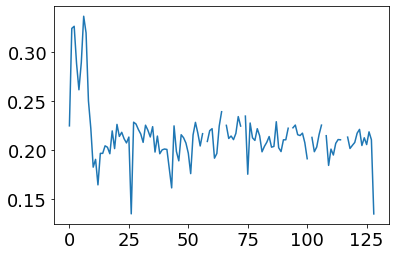

In [103]:
plt.plot(check_matches(ALDI_hash, full_spec_dB, freq, full_t, window_length=50, min_distance=5, threshold_abs=-60))

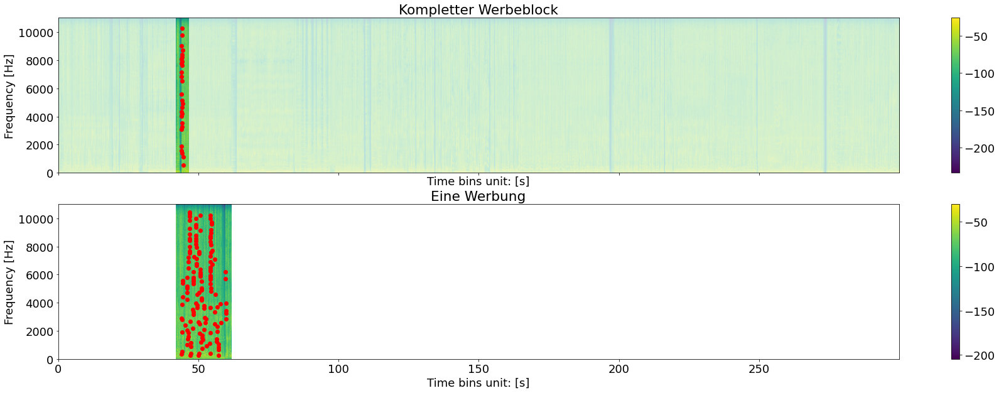

In [81]:
window_start = 452
window_length = 50
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(30, 10), facecolor='white', sharex=True, sharey=True)
ax = axes.ravel()

# Plot the complete spectrum
im0 = ax[0].imshow(np.flipud(full_spec_dB), cmap='viridis', extent=(0, np.amax(full_t), freq[0], freq[-1]))
# Add some white shading
ax[0].broken_barh([(0, full_t[window_start]), (full_t[window_start + window_length], full_t[-1] - full_t[window_start + window_length])], (freq[0], freq[-1]), facecolors='w', alpha=.7)
# Obtain and plot the coordinates in the non-shaded area.
freq_coords, time_coords = identify_peaks(full_spec_dB[:, window_start : window_start + window_length + 1], min_distance=20, threshold_abs=-60)
ax[0].scatter(full_t[time_coords + window_start], freq[freq_coords], color='r')

ax[0].set_xlabel('Time bins unit: [s]')
ax[0].set_ylabel('Frequency [Hz]')
ax[0].set_title('Kompletter Werbeblock')
ax[0].axis('auto')
plt.colorbar(mappable=im0, ax=ax[0])

im1 = ax[1].imshow(np.flipud(ALDI_spec_dB), cmap='viridis', extent=(full_t[452], full_t[452 + ALDI_spec_dB.shape[1]], freq[0], freq[-1]))
# Obtain and plot the coordinates in the peaks
freq_coords, time_coords = identify_peaks(ALDI_spec_dB, min_distance=20, threshold_abs=-60)
ax[1].scatter(full_t[time_coords + 452], freq[freq_coords], color='r')
ax[1].set_xlabel('Time bins unit: [s]')
ax[1].set_ylabel('Frequency [Hz]')
ax[1].set_title('Eine Werbung')
ax[1].axis('auto')
plt.colorbar(mappable=im1, ax=ax[1])

plt.show()